In [1]:
!pip install opendatasets
!pip install pandas

In [2]:
import opendatasets as od
import pandas


In [3]:
od.download("https://www.kaggle.com/datasets/farukalam/tomato-leaf-diseases-detection-computer-vision/data",force=True)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: amitarajak
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/farukalam/tomato-leaf-diseases-detection-computer-vision


100%|██████████| 23.9M/23.9M [00:00<00:00, 146MB/s] 

In [4]:
import os
import shutil

# Define the path to the dataset directory
dataset_dir = '/content/tomato-leaf-diseases-detection-computer-vision'

# Define the folders to remove from
folders_to_remove = ['test', 'train', 'valid']

# Loop through each folder and remove the 'labels' folder
for folder_name in folders_to_remove:
    folder_path = os.path.join(dataset_dir, folder_name)
    labels_folder_path = os.path.join(folder_path, 'labels')

    if os.path.exists(labels_folder_path):
        shutil.rmtree(labels_folder_path)
        print(f"Removed 'labels' folder from {folder_name} dataset.")
    else:
        print(f"'labels' folder not found in {folder_name} dataset.")

print("Data preprocessing completed successfully.")


Removed 'labels' folder from test dataset.
Removed 'labels' folder from train dataset.
Removed 'labels' folder from valid dataset.
Data preprocessing completed successfully.


In [5]:
od.download("https://www.kaggle.com/datasets/kaustubhb999/tomatoleaf/data")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: amitarajak
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/kaustubhb999/tomatoleaf


100%|██████████| 179M/179M [00:01<00:00, 100MB/s]


In [6]:
od.download("https://www.kaggle.com/datasets/paulrosero/tomato-leaf-illness-detection",force=True)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: amitarajak
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/paulrosero/tomato-leaf-illness-detection


100%|██████████| 22.2M/22.2M [00:00<00:00, 93.0MB/s]


In [7]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
import warnings
from tqdm import tqdm
from skimage.transform import resize
from skimage.io import imread
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, roc_auc_score
from sklearn.linear_model import LogisticRegression
# Ignore all warnings
warnings.filterwarnings("ignore")

In [8]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/content/tomato-leaf-diseases-detection-computer-vision'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/content/tomato-leaf-diseases-detection-computer-vision/README.roboflow.txt
/content/tomato-leaf-diseases-detection-computer-vision/data.yaml
/content/tomato-leaf-diseases-detection-computer-vision/README.dataset.txt
/content/tomato-leaf-diseases-detection-computer-vision/valid/images/IMG_0348_JPG.rf.224036500acd87dc9766c6be084e67a5.jpg
/content/tomato-leaf-diseases-detection-computer-vision/valid/images/IMG_0211_JPG.rf.e63eae2f4e0a7ba599feed7fc4dc8436.jpg
/content/tomato-leaf-diseases-detection-computer-vision/valid/images/IMG_1072_JPG.rf.9e3ea1c8934854811d2480958b2667f6.jpg
/content/tomato-leaf-diseases-detection-computer-vision/valid/images/IMG_1103_JPG.rf.1b03cf0c5d7b5cec978f9ede508e9ac7.jpg
/content/tomato-leaf-diseases-detection-computer-vision/valid/images/IMG_0559_JPG.rf.3cb9896be8699161fda0821ea0a01baf.jpg
/content/tomato-leaf-diseases-detection-computer-vision/valid/images/IMG_0230_JPG.rf.6aa737da228dfd6ab26b74bbcd84b98e.jpg
/content/tomato-leaf-diseases-detection-computer-vi

In [9]:
import os
import shutil

valid_dir = "/content/tomato-leaf-diseases-detection-computer-vision/valid/images"
train_dir = "/content/tomato-leaf-diseases-detection-computer-vision/train/images"
test_dir = "/content/tomato-leaf-diseases-detection-computer-vision/test/images"

# List files in the valid directory
valid_files = os.listdir(valid_dir)



# Determine the number of images to move to train and test folders
train_count = 31
test_count = 30

# Move images to train folder
for i in range(train_count):
    file_to_move = valid_files[i]
    source_path = os.path.join(valid_dir, file_to_move)
    destination_path = os.path.join(train_dir, file_to_move)
    shutil.move(source_path, destination_path)

# Move images to test folder
for i in range(train_count, train_count + test_count):
    file_to_move = valid_files[i]
    source_path = os.path.join(valid_dir, file_to_move)
    destination_path = os.path.join(test_dir, file_to_move)
    shutil.move(source_path, destination_path)


shutil.rmtree("/content/tomato-leaf-diseases-detection-computer-vision/valid")


print("Images moved to train and test folders. Valid folder dropped.")

Images moved to train and test folders. Valid folder dropped.


In [10]:
import numpy as np
import pandas as pd



import os
for dirname, _, filenames in os.walk('/content/tomato-leaf-illness-detection'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/content/tomato-leaf-illness-detection/dataset/test/leaves_yellow_stains/IMG_9108.jpg
/content/tomato-leaf-illness-detection/dataset/test/leaves_yellow_stains/20230704_213948233_iOS.jpg
/content/tomato-leaf-illness-detection/dataset/test/leaves_yellow_stains/IMG_9133.jpg
/content/tomato-leaf-illness-detection/dataset/test/leaves_yellow_stains/20230704_214208733_iOS.jpg
/content/tomato-leaf-illness-detection/dataset/test/leaves_yellow_stains/20230704_214137567_iOS.jpg
/content/tomato-leaf-illness-detection/dataset/test/leaves_yellow_stains/IMG_9074.jpg
/content/tomato-leaf-illness-detection/dataset/test/leaves_yellow_stains/20230704_213934008_iOS.jpg
/content/tomato-leaf-illness-detection/dataset/test/leaves_yellow_stains/20230704_214406133_iOS.jpg
/content/tomato-leaf-illness-detection/dataset/test/leaves_yellow_stains/20230704_214005636_iOS.jpg
/content/tomato-leaf-illness-detection/dataset/test/leaves_yellow_stains/20230704_214314767_iOS.jpg
/content/tomato-leaf-illness-detection/dat

In [11]:
import numpy as np
import pandas as pd



import os
for dirname, _, filenames in os.walk('/content/tomatoleaf'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


Streaming output truncated to the last 5000 lines.
/content/tomatoleaf/tomato/train/Tomato___Early_blight/f459c3ee-91f9-42e4-8a61-8c2b6ba9a435___RS_Erly.B 9522.JPG
/content/tomatoleaf/tomato/train/Tomato___Early_blight/c27f6ed4-7ae2-4187-8e96-edafd886f123___RS_Erly.B 7618.JPG
/content/tomatoleaf/tomato/train/Tomato___Early_blight/Tomato___Early_blight_original_6fbefe16-4635-4a03-b245-65594ded39cf___RS_Erly.B 7654.JPG_dc257786-3fee-4bdf-b032-5ff89735c361.JPG
/content/tomatoleaf/tomato/train/Tomato___Early_blight/52082b15-4350-415a-be8c-bb0e0fc3ab88___RS_Erly.B 6332.JPG
/content/tomatoleaf/tomato/train/Tomato___Early_blight/4490b039-427d-414c-836d-a1fda6c1ad49___RS_Erly.B 8369.JPG
/content/tomatoleaf/tomato/train/Tomato___Early_blight/801083ae-26f9-4a9a-9e9a-f73fb18b67e5___RS_Erly.B 7363.JPG
/content/tomatoleaf/tomato/train/Tomato___Early_blight/c8dd6713-727e-4811-b951-e70e44d0c483___RS_Erly.B 7817.JPG
/content/tomatoleaf/tomato/train/Tomato___Early_blight/4e3f49fc-2ff8-4d00-979d-3c15f4d

In [12]:
!mv /content/tomato-leaf-diseases-detection-computer-vision/train/* /content/tomatoleaf/tomato/train

In [13]:
!mv /content/tomato-leaf-diseases-detection-computer-vision/test/* /content/tomatoleaf/tomato/val


In [14]:
!mv /content/tomato-leaf-illness-detection/dataset/train/* /content/tomatoleaf/tomato/train


In [15]:
!mv /content/tomato-leaf-illness-detection/dataset/test/* /content/tomatoleaf/tomato/val

In [16]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

train_dir = "/content/tomatoleaf/tomato/train"
test_dir="/content/tomatoleaf/tomato/test"


img_width, img_height = 150, 150
batch_size = 32


train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')


train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

Found 11060 images belonging to 15 classes.


In [17]:
from google.colab import files

uploaded = files.upload()


Saving output12.csv to output12.csv


In [18]:
import pandas as pd
oth_df = pd.read_csv('output12.csv')

# Display the DataFrame

In [19]:
X=oth_df.drop(columns='Conditionss')
X.head()

,N,P,K,temperature,humidity,ph,rainfall,Soil Humidity
0,90,42,43,20,82.002744,6,202,0
1,85,58,41,21,80.319644,7,226,0
2,60,55,44,23,82.320763,7,263,0
3,74,35,40,26,80.158363,6,242,0
4,78,42,42,20,81.604873,7,262,0


In [20]:
y=oth_df[['Conditionss']]
y

,Conditionss
0,Perfect for growth
1,Perfect for growth
2,Perfect for growth
3,Perfect for growth
4,Perfect for growth
...,...
11054,"Not perfect for growth: Inaccurate ph, Inaccur..."
11055,"Not perfect for growth: Inaccurate ph, Inaccur..."
11056,"Not perfect for growth: Inaccurate ph, Inaccur..."
11057,"Not perfect for growth: Inaccurate ph, Inaccur..."


In [21]:
Y=pd.get_dummies(y)
Y.head(20)

,Conditionss_Not perfect for growth: Inaccurate nitrogen,"Conditionss_Not perfect for growth: Inaccurate nitrogen, Inaccurate phosphorus","Conditionss_Not perfect for growth: Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate nitrogen, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate nitrogen, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate ph, Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate ph, Inaccurate nitrogen, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate ph, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate ph, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium, Inaccurate potassium",...,"Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate phosphorus","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate phosphorus, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate phosphorus, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate potassium, Inaccurate potassium",Conditionss_Perfect for growth
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
5,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
6,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
8,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [22]:
Y_new=Y.drop(columns='Conditionss_Perfect for growth')
Y_new.head(10)

,Conditionss_Not perfect for growth: Inaccurate nitrogen,"Conditionss_Not perfect for growth: Inaccurate nitrogen, Inaccurate phosphorus","Conditionss_Not perfect for growth: Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate nitrogen, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate nitrogen, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate ph, Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate ph, Inaccurate nitrogen, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate ph, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate ph, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium, Inaccurate potassium",...,"Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate phosphorus","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate phosphorus, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate nitrogen, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate phosphorus","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate phosphorus, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate phosphorus, Inaccurate potassium, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate potassium","Conditionss_Not perfect for growth: Inaccurate temperature level, Inaccurate rainfall, Inaccurate potassium, Inaccurate potassium"
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [23]:
Y_newest=Y[['Conditionss_Perfect for growth']]
Y_newest.head(10)

,Conditionss_Perfect for growth
0,True
1,True
2,True
3,True
4,True
5,True
6,False
7,True
8,False
9,False


In [24]:
Y_newest = Y_newest.astype(int)
Y_newest.shape

(11059, 1)

In [25]:
Y_newest=Y_newest.values.ravel()



In [26]:
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X_scaled.shape

(11059, 8)

In [27]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.layers import Input, Flatten, Dense, Conv2D, MaxPooling2D, Concatenate
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
input_h5 = Input(shape=(150, 150, 3), name='input_h5')
input_keras = Input(shape=(8,), name='input_keras')

# Define custom model for saved_model.h5
x = Conv2D(32, (3, 3), activation='relu')(input_h5)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
output_h5 = Dense(15, activation='softmax', name='output_h5')(x)

# Define custom model for saved_str.keras
y = Dense(64, activation='relu')(input_keras)
y = Dense(32, activation='relu')(y)
output_keras = Dense(1, activation='sigmoid', name='output_keras')(y)

# Concatenate the output of the first model and the output of the second model
combined_output = Concatenate(name='concatenate')([output_h5, output_keras])

# Create the new combined model
combined_model = Model(inputs=[input_h5, input_keras], outputs=combined_output)

# Compile the combined model
combined_model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Print the summary of the combined model
combined_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_h5 (InputLayer)       [(None, 150, 150, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 148, 148, 32)         896       ['input_h5[0][0]']            
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 74, 74, 32)           0         ['conv2d[0][0]']              
 D)                                                                                               
                                                                                                  
 conv2d_1 (Conv2D)           (None, 72, 72, 64)           18496     ['max_pooling2d[0][0]']   

In [28]:
img_width, img_height = 150, 150
batch_size = 32
train_dir = '/content/tomatoleaf/tomato/train'
test_dir='/content/tomatoleaf/tomato/test'

train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)  # Use validation split
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'  # Set as training data
)

validation_generator = train_datagen.flow_from_directory(
    train_dir,  # Same directory as training data
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'  # Set as validation data
)
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,  # Directory for test data
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Typically, you don't shuffle test data
)


Found 8851 images belonging to 15 classes.
Found 2209 images belonging to 15 classes.
Found 1161 images belonging to 15 classes.


In [29]:
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Flatten, Dense, Conv2D, MaxPooling2D, Concatenate
from tensorflow.keras.optimizers import Adam

# Define image dimensions and batch size
img_width, img_height = 150, 150
batch_size = 32

# Define directories for training and test data
train_dir = '/content/tomatoleaf/tomato/train'
test_dir = '/content/tomatoleaf/tomato/test'

# Load and preprocess image data using ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
test_datagen = ImageDataGenerator(rescale=1./255)

# Prepare train and validation image data
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)
validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

# Prepare test image data
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Typically, you don't shuffle test data
)

# Load your non-image data
# Assuming X_newest is your non-image data and Y_newest is your labels for non-image data
X_scaled = np.random.rand(11059, 8)  # Example non-image data
Y_newest = np.random.randint(0, 2, (11059, 1))  # Example labels for non-image data

# Split the non-image data into training, validation, and test sets
X_train_non_image, X_temp_non_image, y_train_non_image, y_temp_non_image = train_test_split(
    X_scaled, Y_newest, test_size=0.4, random_state=42
)
X_val_non_image, X_test_non_image, y_val_non_image, y_test_non_image = train_test_split(
    X_temp_non_image, y_temp_non_image, test_size=0.5, random_state=42
)

# Combine image and non-image data for training and validation
def combined_generator(image_gen, non_image_data, non_image_labels, batch_size):
    while True:
        img_batch, img_labels = next(image_gen)
        start_idx = (image_gen.batch_index - 1) * batch_size
        end_idx = start_idx + batch_size
        non_img_batch = non_image_data[start_idx:end_idx]
        non_img_labels = non_image_labels[start_idx:end_idx].flatten()  # Flatten the labels

        if len(img_batch) != len(non_img_batch):
            continue  # Skip the batch if sizes do not match

        yield [img_batch, non_img_batch], [img_labels, non_img_labels]

train_combined_generator = combined_generator(train_generator, X_train_non_image, y_train_non_image, batch_size)
val_combined_generator = combined_generator(validation_generator, X_val_non_image, y_val_non_image, batch_size)

# Define the model
image_input = Input(shape=(img_width, img_height, 3), name='image_input')
x = Conv2D(32, (3, 3), activation='relu')(image_input)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
image_output = Dense(15, activation='softmax', name='image_output')(x)

non_image_input = Input(shape=(8,), name='non_image_input')
y = Dense(64, activation='relu')(non_image_input)
y = Dense(32, activation='relu')(y)
non_image_output = Dense(1, activation='sigmoid', name='non_image_output')(y)

combined = Concatenate()([image_output, non_image_output])
model = Model(inputs=[image_input, non_image_input], outputs=[image_output, non_image_output])

# Compile the model
model.compile(optimizer=Adam(),
              loss={'image_output': 'categorical_crossentropy', 'non_image_output': 'binary_crossentropy'},
              metrics={'image_output': 'accuracy', 'non_image_output': 'accuracy'})

# Fit the combined model
model.fit(
    train_combined_generator,
    steps_per_epoch=len(train_generator),
    validation_data=val_combined_generator,
    validation_steps=len(validation_generator),
    epochs=5
)

# Testing the combined model


Found 8851 images belonging to 15 classes.
Found 2209 images belonging to 15 classes.
Found 1161 images belonging to 15 classes.
Epoch 1/5
277/277 [==============================] - 506s 2s/step - loss: 2.1449 - image_output_loss: 1.4507 - non_image_output_loss: 0.6942 - image_output_accuracy: 0.5053 - non_image_output_accuracy: 0.5036 - val_loss: 1.5676 - val_image_output_loss: 0.8743 - val_non_image_output_loss: 0.6932 - val_image_output_accuracy: 0.7004 - val_non_image_output_accuracy: 0.5161
Epoch 2/5
277/277 [==============================] - 507s 2s/step - loss: 1.3765 - image_output_loss: 0.6836 - non_image_output_loss: 0.6929 - image_output_accuracy: 0.7578 - non_image_output_accuracy: 0.5109 - val_loss: 1.2998 - val_image_output_loss: 0.6051 - val_non_image_output_loss: 0.6947 - val_image_output_accuracy: 0.7937 - val_non_image_output_accuracy: 0.5054
Epoch 3/5
277/277 [==============================] - 502s 2s/step - loss: 1.1813 - image_output_loss: 0.4887 - non_image_output

In [30]:
model.save('model.keras')

In [32]:

test_generator.reset()  # Reset the generator to start from the beginning
num_samples = len(test_generator.filenames)  # Total number of samples in the test set
test_steps = num_samples // batch_size + 1

test_loss, test_accuracy_image, test_accuracy_non_image = 0, 0, 0

for step in range(test_steps):
    test_img_batch, test_img_labels = next(test_generator)
    start_idx = step * batch_size
    end_idx = start_idx + batch_size
    test_non_img_batch = X_test_non_image[start_idx:end_idx]
    test_non_img_labels = y_test_non_image[start_idx:end_idx].flatten()  # Flatten the labels

    if len(test_img_batch) != len(test_non_img_batch):
        continue  # Skip the batch if sizes do not match

    test_combined_batch = [test_img_batch, test_non_img_batch]
    test_combined_labels = [test_img_labels, test_non_img_labels]

    # Test the model on the current batch
    test_results = model.test_on_batch(test_combined_batch, test_combined_labels)

    test_loss += test_results[0]  # Accumulate the loss

    # Accumulate the image and non-image accuracies
    test_accuracy_image += test_results[4]
    test_accuracy_non_image += test_results[3]  # Access the accuracy for the non-image output

test_loss /= test_steps
test_accuracy_image /= test_steps
test_accuracy_non_image /= test_steps
print(f'Test Loss: {test_loss:.4f}, Test Image Accuracy: {test_accuracy_image:.4f}, Test Non-Image Accuracy: {test_accuracy_non_image:.4f}')

Test Loss: 1.2300, Test Image Accuracy: 0.4958, Test Non-Image Accuracy: 0.8015


Found 1161 images belonging to 15 classes.
Test Loss: 1.2674, Test Image Accuracy: 0.4884, Test Non-Image Accuracy: 0.8225
1/1 [==============================] - 0s 126ms/step


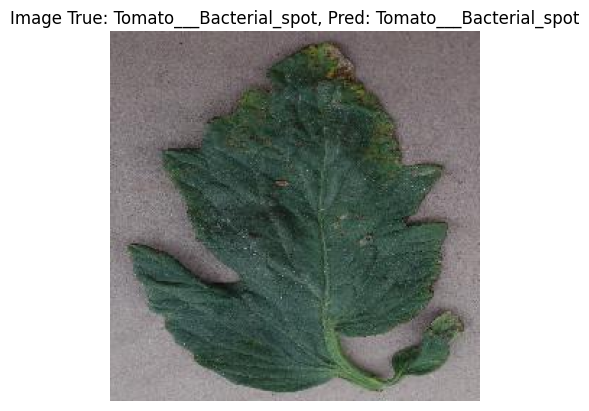

Sample 1:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: Not perfect for growth deficiency
Non-Image Predicted Label: Not perfect for growth deficiency



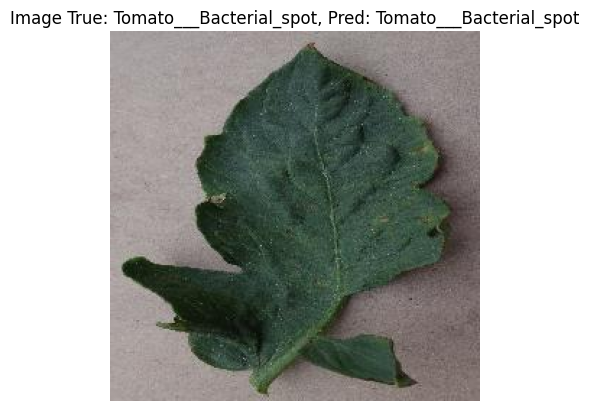

Sample 2:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: perfect for growth
Non-Image Predicted Label: Not perfect for growth deficiency



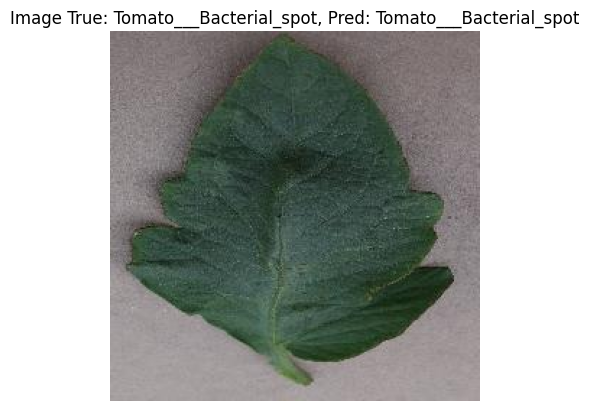

Sample 3:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: perfect for growth
Non-Image Predicted Label: Not perfect for growth deficiency



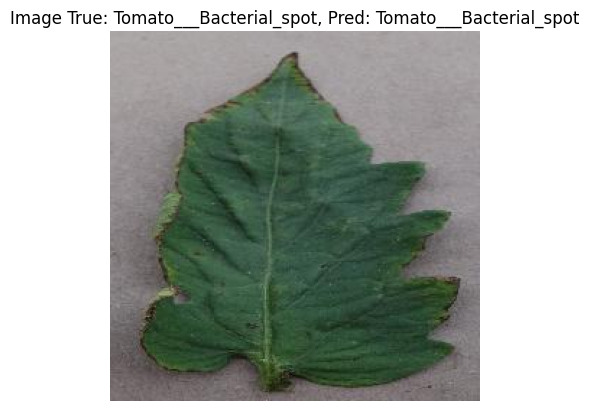

Sample 4:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: Not perfect for growth deficiency
Non-Image Predicted Label: Not perfect for growth deficiency



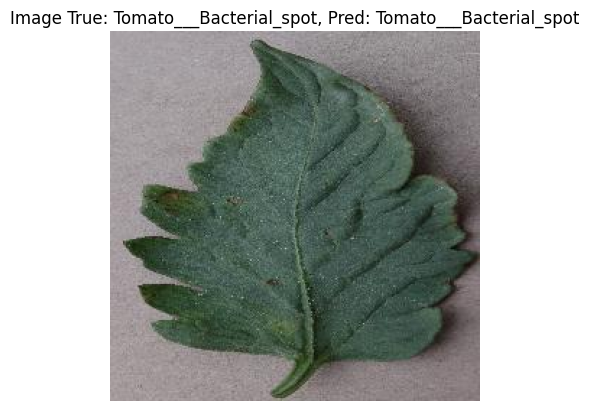

Sample 5:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: perfect for growth
Non-Image Predicted Label: Not perfect for growth deficiency



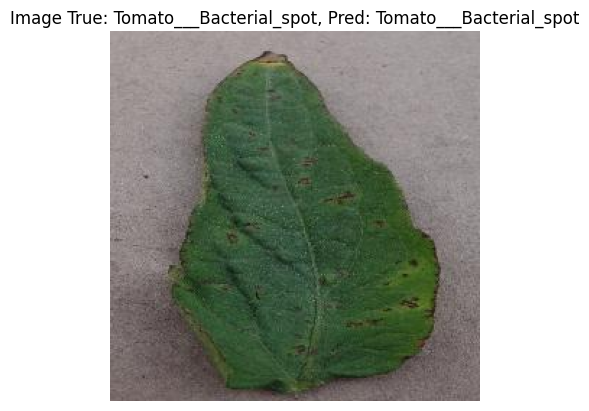

Sample 6:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: Not perfect for growth deficiency
Non-Image Predicted Label: perfect for growth



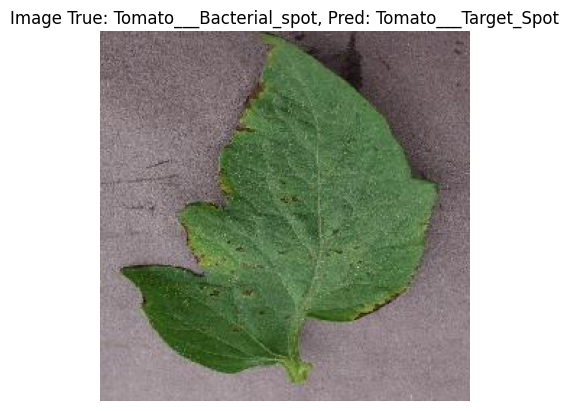

Sample 7:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Target_Spot
Non-Image True Label: Not perfect for growth deficiency
Non-Image Predicted Label: Not perfect for growth deficiency



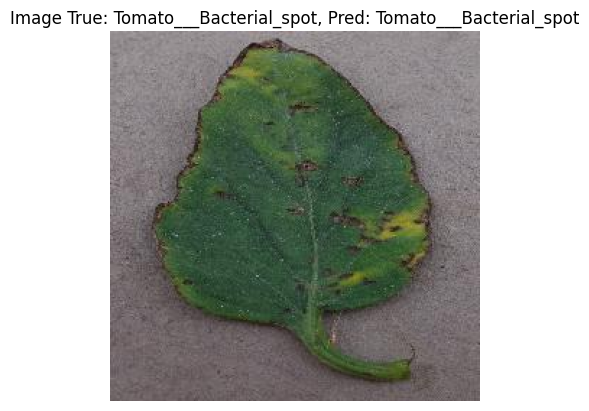

Sample 8:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: Not perfect for growth deficiency
Non-Image Predicted Label: Not perfect for growth deficiency



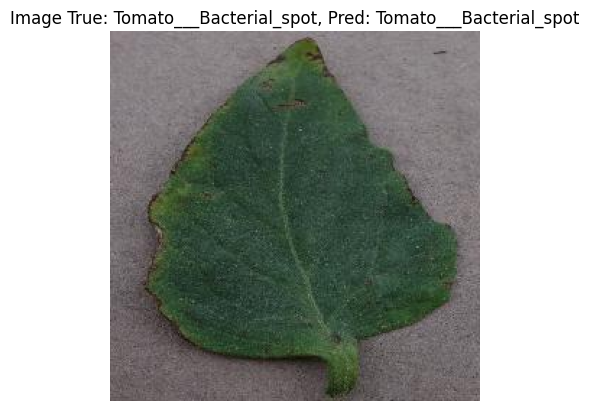

Sample 9:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: Not perfect for growth deficiency
Non-Image Predicted Label: Not perfect for growth deficiency



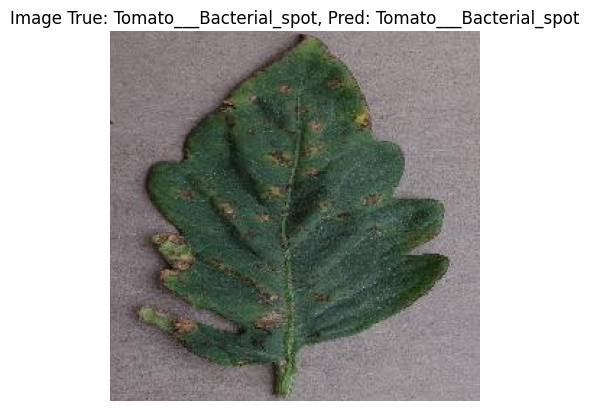

Sample 10:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: perfect for growth
Non-Image Predicted Label: Not perfect for growth deficiency



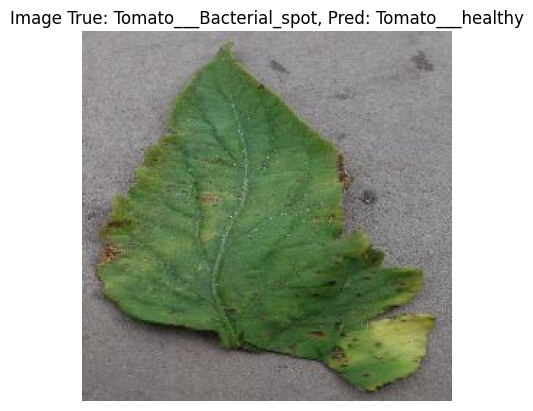

Sample 11:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___healthy
Non-Image True Label: Not perfect for growth deficiency
Non-Image Predicted Label: Not perfect for growth deficiency



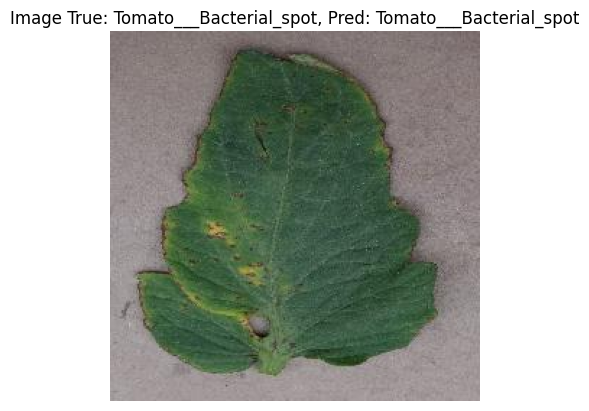

Sample 12:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: Not perfect for growth deficiency
Non-Image Predicted Label: perfect for growth



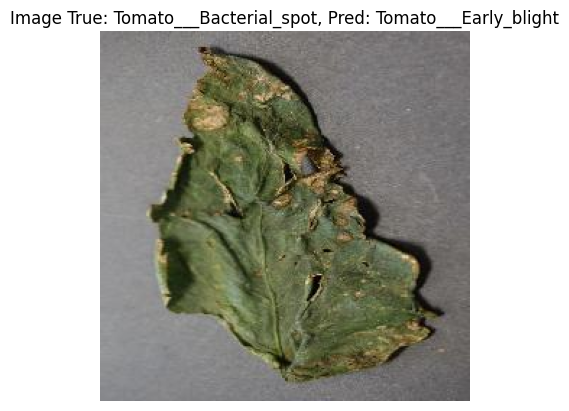

Sample 13:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Early_blight
Non-Image True Label: Not perfect for growth deficiency
Non-Image Predicted Label: Not perfect for growth deficiency



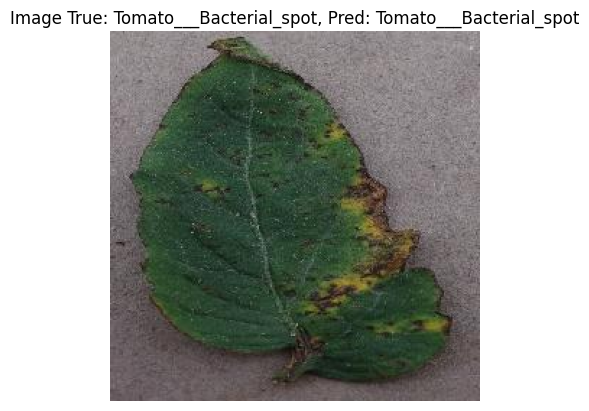

Sample 14:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: perfect for growth
Non-Image Predicted Label: perfect for growth



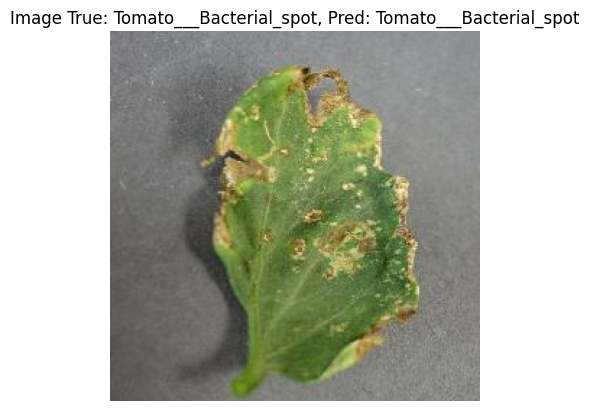

Sample 15:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: perfect for growth
Non-Image Predicted Label: Not perfect for growth deficiency



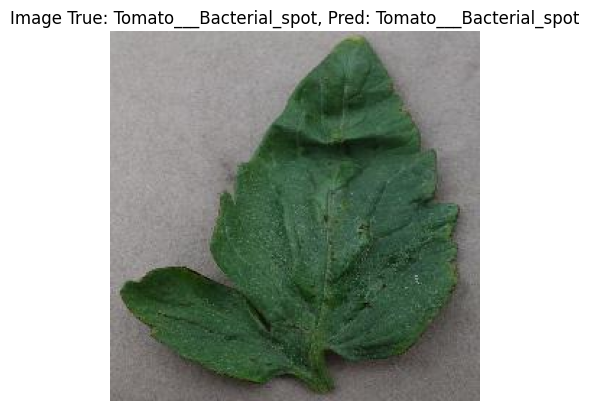

Sample 16:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: perfect for growth
Non-Image Predicted Label: Not perfect for growth deficiency



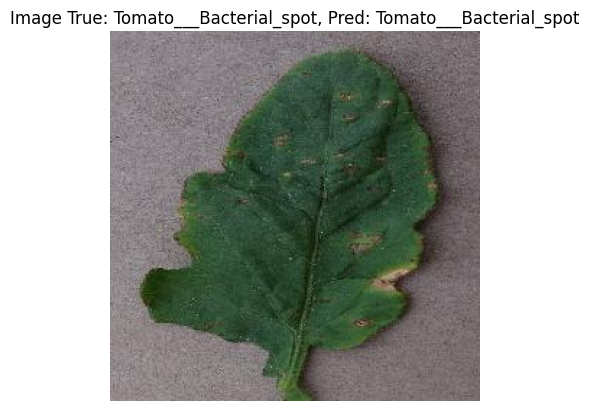

Sample 17:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: perfect for growth
Non-Image Predicted Label: Not perfect for growth deficiency



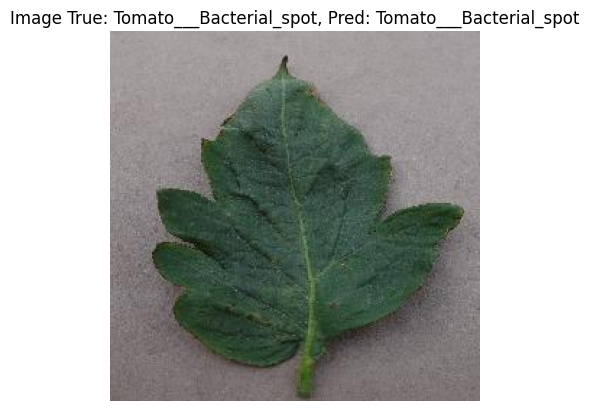

Sample 18:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: Not perfect for growth deficiency
Non-Image Predicted Label: Not perfect for growth deficiency



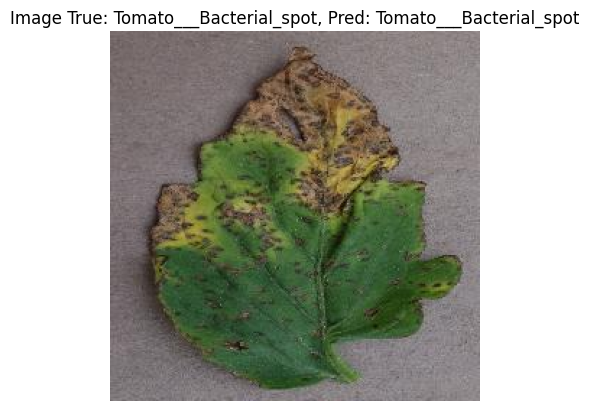

Sample 19:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: Not perfect for growth deficiency
Non-Image Predicted Label: Not perfect for growth deficiency



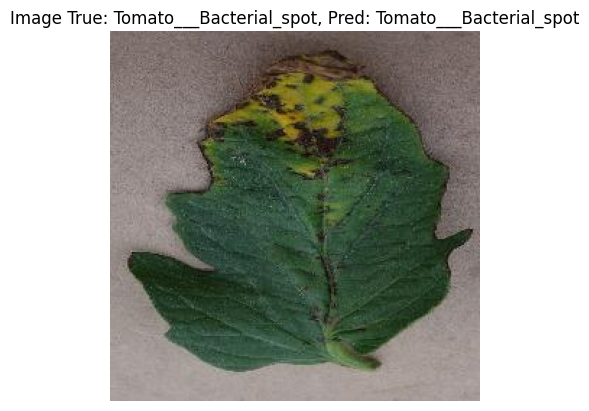

Sample 20:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: Not perfect for growth deficiency
Non-Image Predicted Label: Not perfect for growth deficiency



In [43]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the correct class names based on the model's output
class_names = [
    "Tomato___Bacterial_spot", "Tomato___Early_blight", "Tomato___Late_blight", "Tomato___Septoria_leaf_spot",
    "Tomato___Leaf_Mold", "Tomato___Spider_mites Two-spotted_spider_mite", "Tomato___Target_Spot",
    "Tomato___Tomato_Yellow_Leaf_Curl_Virus", "Tomato___Tomato_mosaic_virus", "Tomato___healthy",
    "dried_leaves", "healthy_leaves", "images", "leaves_with_stains", "leaves_yellow_stains"
]

# Define the test directory
test_dir = "/content/tomatoleaf/tomato/test"

# Define image dimensions and batch size
img_width, img_height = 150, 150
batch_size = 32

# Load test image data using ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Typically, you don't shuffle test data
)

# Assuming X_test_non_image and y_test_non_image are your test non-image data and labels
X_test_non_image = np.random.rand(11059, 8)  # Example non-image test data
y_test_non_image = np.random.randint(0, 2, (11059, 1))  # Example labels for non-image data

# Define label mappings for non-image data
non_image_label_map = {0: 'Not perfect for growth deficiency', 1: 'perfect for growth'}

# Initialize lists to store predictions
predictions_image = []
predictions_non_image = []

# Get the total number of samples in the test set
num_samples = len(test_generator.filenames)

# Calculate the number of steps needed to process the test set
test_steps = num_samples // batch_size + 1

# Reset the generator to start from the beginning
test_generator.reset()

test_loss, test_accuracy_image, test_accuracy_non_image = 0, 0, 0

# Loop through each batch of the test set
for step in range(test_steps):
    try:
        test_img_batch, test_img_labels = next(test_generator)
    except StopIteration:
        break
    start_idx = step * batch_size
    end_idx = min((step + 1) * batch_size, num_samples)
    test_non_img_batch = X_test_non_image[start_idx:end_idx]
    test_non_img_labels = y_test_non_image[start_idx:end_idx].flatten()

    if len(test_img_batch) != len(test_non_img_batch):
        continue  # Skip the batch if sizes do not match

    test_combined_batch = [test_img_batch, test_non_img_batch]
    test_combined_labels = [test_img_labels, test_non_img_labels]

    # Test the model on the current batch
    test_results = model.test_on_batch(test_combined_batch, test_combined_labels)

    test_loss += test_results[0]  # Accumulate the loss

    # Accumulate the image and non-image accuracies
    test_accuracy_image += test_results[4]
    test_accuracy_non_image += test_results[3]  # Access the accuracy for the non-image output

test_loss /= test_steps
test_accuracy_image /= test_steps
test_accuracy_non_image /= test_steps
print(f'Test Loss: {test_loss:.4f}, Test Image Accuracy: {test_accuracy_image:.4f}, Test Non-Image Accuracy: {test_accuracy_non_image:.4f}')

# Predict on the test data and display results
predictions_image = []
predictions_non_image = []
true_labels_image = []
true_labels_non_image = []

test_generator.reset()  # Ensure the generator is at the start

for step in range(test_steps):
    try:
        test_img_batch, test_img_labels = next(test_generator)
    except StopIteration:
        break
    start_idx = step * batch_size
    end_idx = min((step + 1) * batch_size, num_samples)
    test_non_img_batch = X_test_non_image[start_idx:end_idx]
    test_non_img_labels = y_test_non_image[start_idx:end_idx].flatten()

    if len(test_img_batch) != len(test_non_img_batch):
        continue  # Skip the batch if sizes do not match

    test_combined_batch = [test_img_batch, test_non_img_batch]

    # Generate predictions for the combined batch
    batch_predictions = model.predict(test_combined_batch)

    # Separate predictions for image and non-image data
    predicted_image_class = np.argmax(batch_predictions[0], axis=1)
    predicted_non_image_label = (batch_predictions[1] > 0.5).astype(int).flatten()

    predictions_image.extend(predicted_image_class)
    predictions_non_image.extend(predicted_non_image_label)
    true_labels_image.extend(np.argmax(test_img_labels, axis=1))
    true_labels_non_image.extend(test_non_img_labels)

# Display the images alongside true and predicted labels
for i in range(min(len(predictions_image), 20)):  # Display 10 samples for demonstration
    true_label_image = true_labels_image[i]
    predicted_label_image = predictions_image[i]

    true_label_non_image = true_labels_non_image[i]
    predicted_label_non_image = predictions_non_image[i]

    # Display the image
    img_path = test_generator.filepaths[i]
    img = plt.imread(img_path)
    plt.imshow(img)
    plt.title(f"Image True: {class_names[true_label_image]}, Pred: {class_names[predicted_label_image]}")
    plt.axis('off')
    plt.show()

    print(f"Sample {i+1}:")
    print("Image True Label:", class_names[true_label_image])
    print("Image Predicted Label:", class_names[predicted_label_image])
    print("Non-Image True Label:", non_image_label_map[true_label_non_image])
    print("Non-Image Predicted Label:", non_image_label_map[predicted_label_non_image])
    print()


1/1 [==============================] - 1s 761ms/step


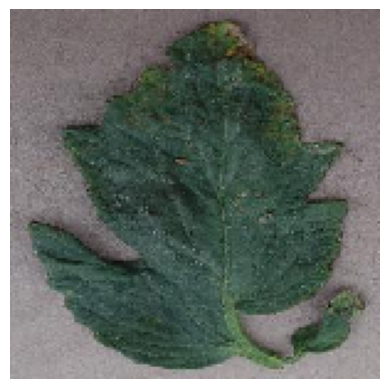

Sample 1:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [1]
Non-Image Predicted Label: False



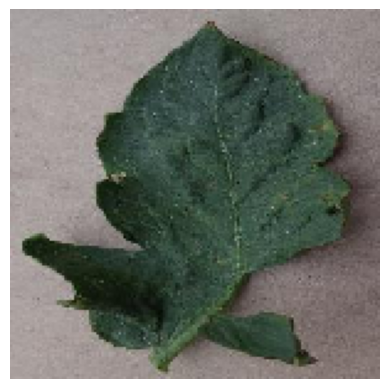

Sample 2:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [9]
Non-Image Predicted Label: True



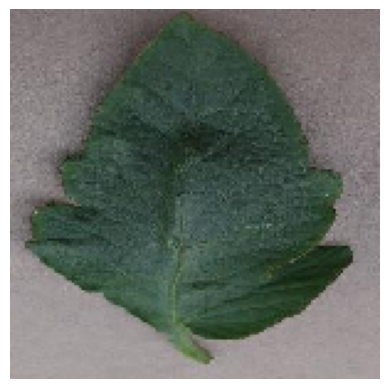

Sample 3:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [10]
Non-Image Predicted Label: False



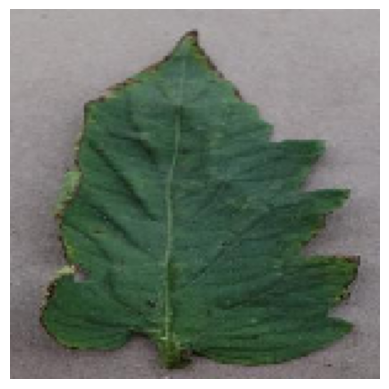

Sample 4:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [7]
Non-Image Predicted Label: False



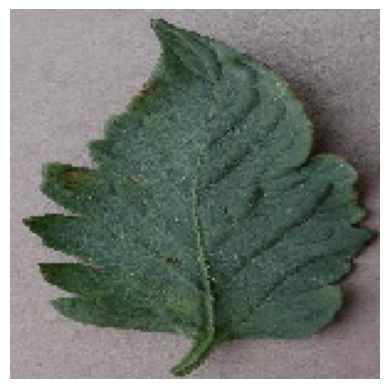

Sample 5:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [7]
Non-Image Predicted Label: False



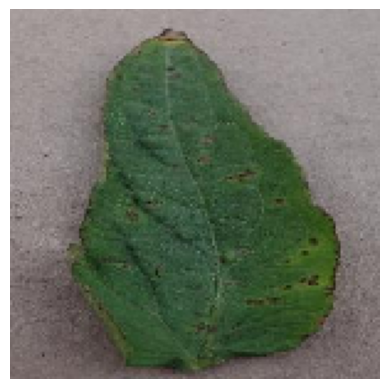

Sample 6:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [4]
Non-Image Predicted Label: False



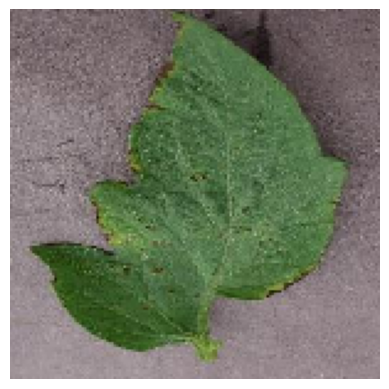

Sample 7:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Target_Spot
Non-Image True Label: [11]
Non-Image Predicted Label: False



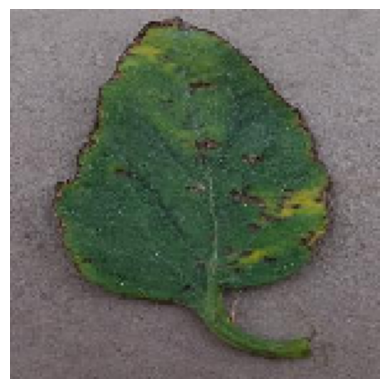

Sample 8:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [5]
Non-Image Predicted Label: False



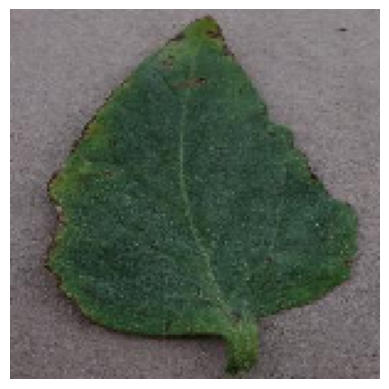

Sample 9:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [12]
Non-Image Predicted Label: False



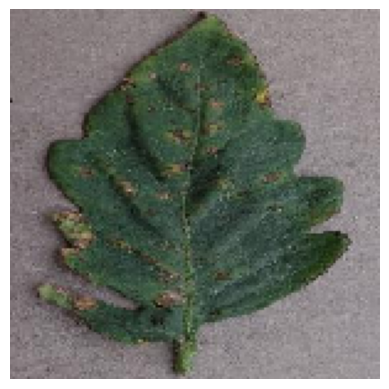

Sample 10:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [10]
Non-Image Predicted Label: False



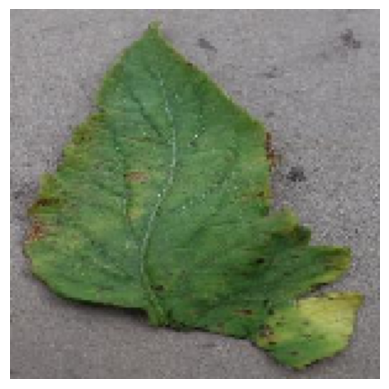

Sample 11:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___healthy
Non-Image True Label: [1]
Non-Image Predicted Label: False



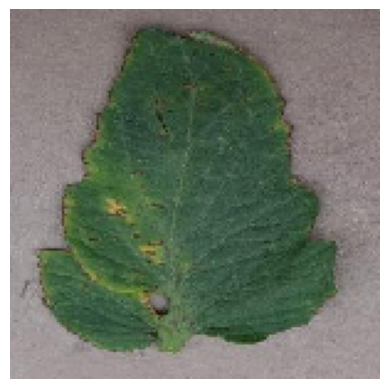

Sample 12:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [3]
Non-Image Predicted Label: False



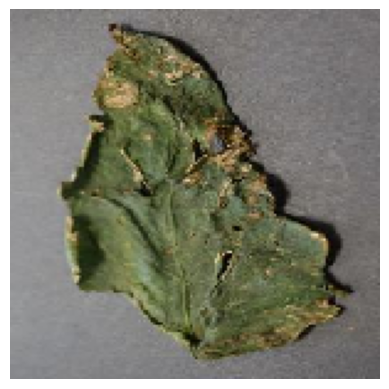

Sample 13:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Early_blight
Non-Image True Label: [7]
Non-Image Predicted Label: False



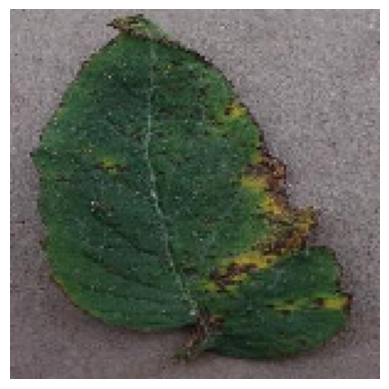

Sample 14:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [10]
Non-Image Predicted Label: False



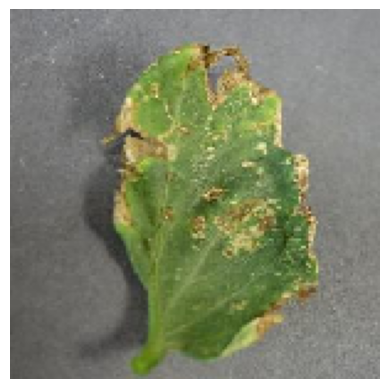

Sample 15:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [14]
Non-Image Predicted Label: False



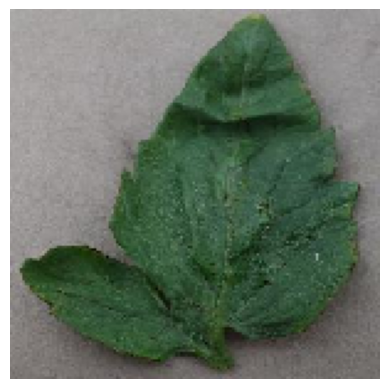

Sample 16:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [1]
Non-Image Predicted Label: False



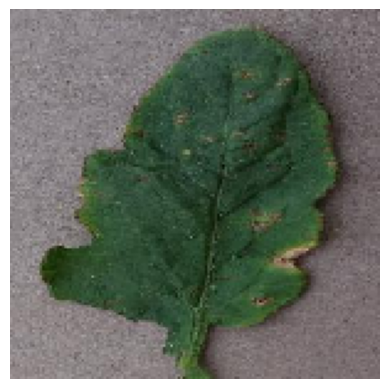

Sample 17:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [8]
Non-Image Predicted Label: False



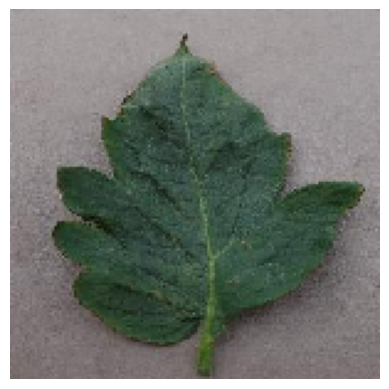

Sample 18:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [12]
Non-Image Predicted Label: False



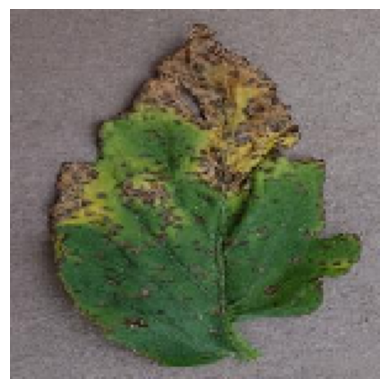

Sample 19:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [0]
Non-Image Predicted Label: False



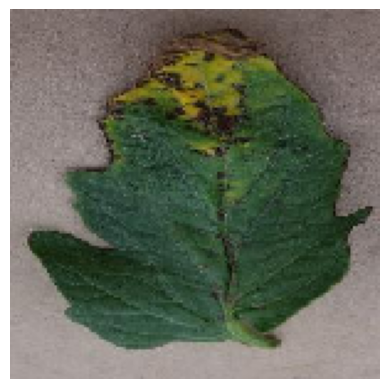

Sample 20:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [5]
Non-Image Predicted Label: False



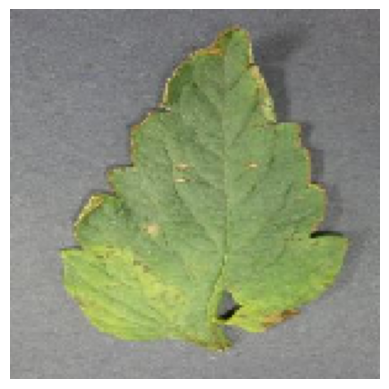

Sample 21:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Tomato_Yellow_Leaf_Curl_Virus
Non-Image True Label: [11]
Non-Image Predicted Label: False



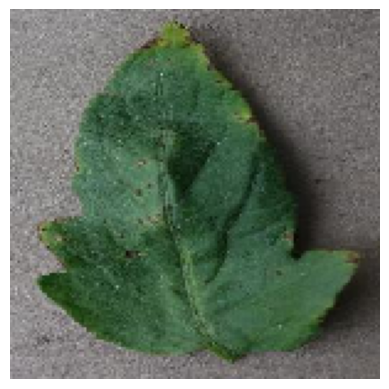

Sample 22:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [4]
Non-Image Predicted Label: False



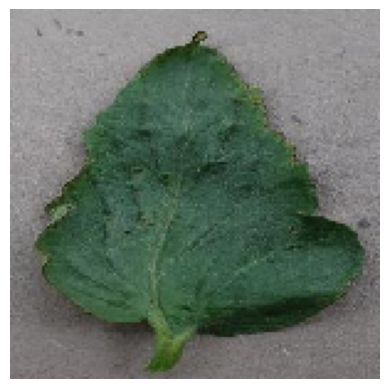

Sample 23:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [8]
Non-Image Predicted Label: False



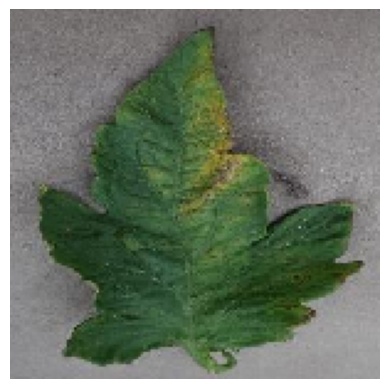

Sample 24:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [5]
Non-Image Predicted Label: False



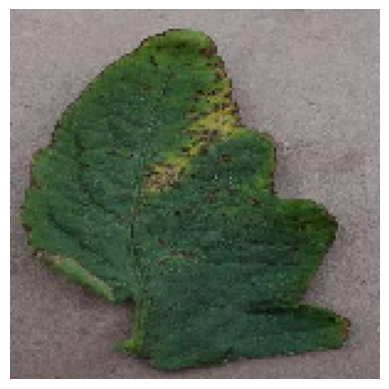

Sample 25:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [8]
Non-Image Predicted Label: False



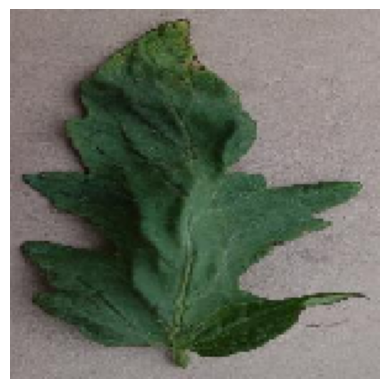

Sample 26:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [12]
Non-Image Predicted Label: False



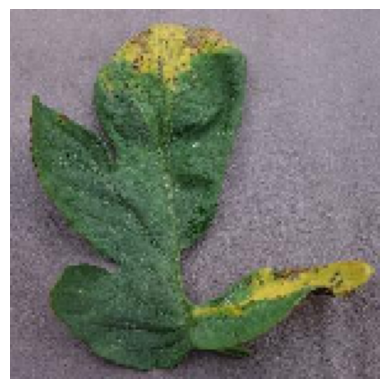

Sample 27:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [0]
Non-Image Predicted Label: False



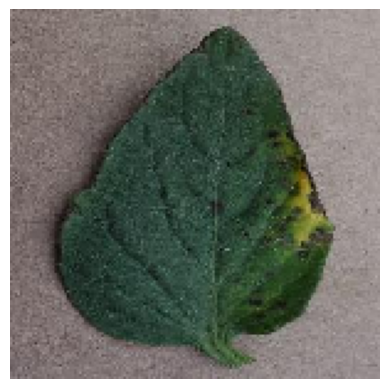

Sample 28:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [14]
Non-Image Predicted Label: False



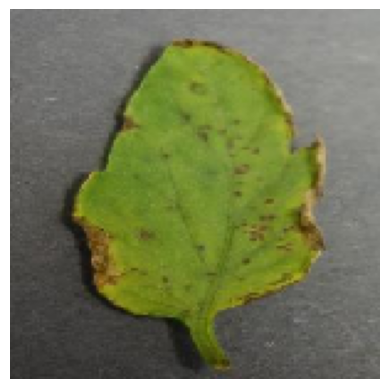

Sample 29:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Tomato_Yellow_Leaf_Curl_Virus
Non-Image True Label: [1]
Non-Image Predicted Label: False



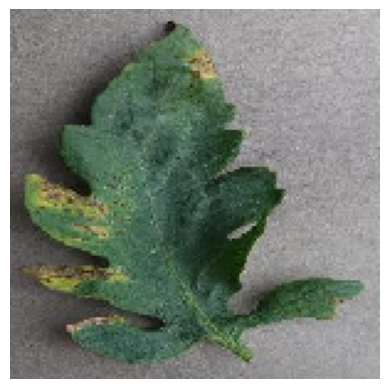

Sample 30:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Bacterial_spot
Non-Image True Label: [3]
Non-Image Predicted Label: False



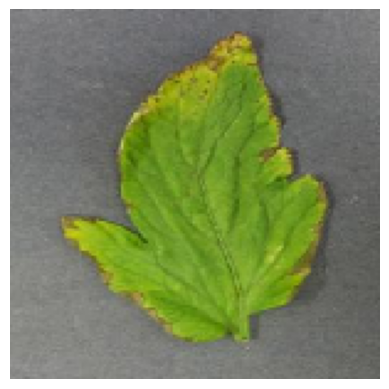

Sample 31:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: Tomato___Tomato_Yellow_Leaf_Curl_Virus
Non-Image True Label: [6]
Non-Image Predicted Label: False



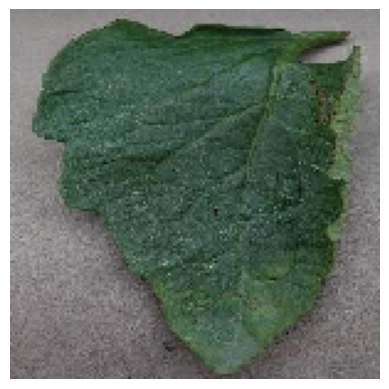

Sample 32:
Image True Label: Tomato___Bacterial_spot
Image Predicted Label: images
Non-Image True Label: [4]
Non-Image Predicted Label: False



In [37]:
#optionalllllll-----------------------
import matplotlib.pyplot as plt

class_names = [
    "Tomato___Bacterial_spot", "Tomato___Early_blight", "Tomato___Late_blight", "Tomato___Septoria_leaf_spot",
    "Tomato___Leaf_Mold", "Tomato___Spider_mites Two-spotted_spider_mite", "Tomato___Target_Spot",
    "Tomato___Tomato_Yellow_Leaf_Curl_Virus", "Tomato___Tomato_mosaic_virus", "Tomato___healthy",
    "dried_leaves", "healthy_leaves", "images", "leaves_with_stains", "leaves_yellow_stains"
]

# Ensure test_generator is reset and prepared
test_generator.reset()

# Obtain a batch of images and labels from the test generator
test_img_batch, test_img_labels = next(test_generator)
test_non_img_labels = y_test_non_image[:len(test_img_batch)]

# Generate predictions for the batch
test_predictions = model.predict([test_img_batch, X_test_non_image[:len(test_img_batch)]])
image_predictions = test_predictions[0]
non_image_predictions = test_predictions[1]

# Display the images alongside true and predicted labels
for i in range(len(test_img_labels)):
    true_label_image = np.argmax(test_img_labels[i])  # True label for image data
    predicted_label_image = np.argmax(image_predictions[i])  # Predicted label for image data
    true_label_non_image = test_non_img_labels[i]  # True label for non-image data
    predicted_label_non_image = non_image_predictions[i][0]  # Predicted label for non-image data

    # Display the image
    plt.imshow(test_img_batch[i])
    plt.axis('off')
    plt.show()

    print(f"Sample {i+1}:")
    print("Image True Label:", class_names[true_label_image])
    print("Image Predicted Label:", class_names[predicted_label_image])
    print("Non-Image True Label:", true_label_non_image)
    print("Non-Image Predicted Label:", predicted_label_non_image > 0.5)  # Assuming binary classification
    print()
